In [62]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os

In [68]:
from google.colab import drive
drive.mount('/content/drive')
!cp -r "/content/drive/MyDrive/24341262_Khaled Saifullah Karim_Lab1 Assignment[CSE463]/Task2/Dataset1" /content/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [69]:
image_list = os.listdir("/content/Dataset1")
print(image_list)

['3.jpeg', '5.jpeg', '1.jpeg', '7.jpeg', '8.jpeg', '10.jpeg', '4.jpeg', '6.jpeg', '9.jpeg', '2.jpeg']


Task 1


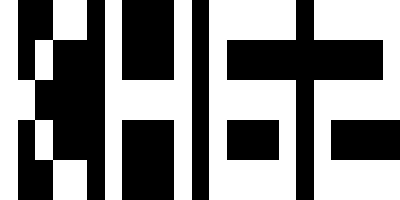

In [26]:

from google.colab.patches import cv2_imshow


Letter_K = np.array([[255, 0, 0, 255, 255],
                     [255, 0, 255, 0, 0],
                     [255, 255, 0, 0, 0],
                     [255, 0, 255, 0, 0],
                     [255, 0, 0, 255, 255]])

Letter_H = np.array([[255, 0, 0, 0, 255],
                     [255, 0, 0, 0, 255],
                     [255, 255, 255, 255, 255],
                     [255, 0, 0, 0, 255],
                     [255, 0, 0, 0, 255]])

Number_6 = np.array([[255, 255, 255, 255, 255],
                     [255, 0, 0, 0, 0],
                     [255, 255, 255, 255, 255],
                     [255, 0, 0, 0, 255],
                     [255, 255, 255, 255, 255]])

Number_2 = np.array([[255, 255, 255, 255, 255],
                     [0, 0, 0, 0, 255],
                     [255, 255, 255, 255, 255],
                     [255, 0, 0, 0, 0],
                     [255, 255, 255, 255, 255]])

KH62 = np.hstack((Letter_K, np.zeros((5, 1), dtype=np.uint8),
                  Letter_H, np.zeros((5, 1), dtype=np.uint8),
                  Number_6, np.zeros((5, 1), dtype=np.uint8),
                  Number_2))

KH62_resized = cv2.resize(KH62, (400, 200), interpolation=cv2.INTER_NEAREST)
cv2_imshow(KH62_resized)

Task 2) 2


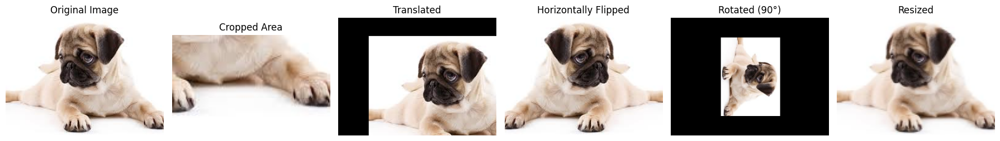

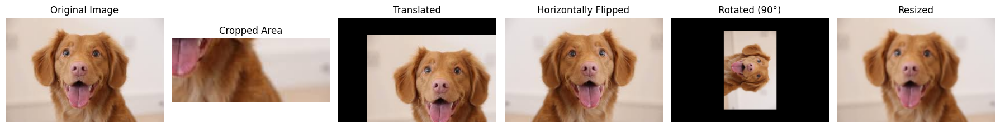

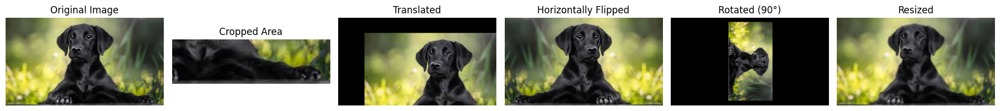

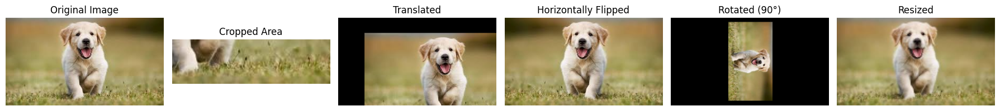

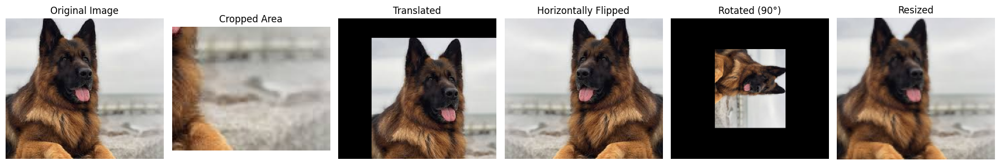

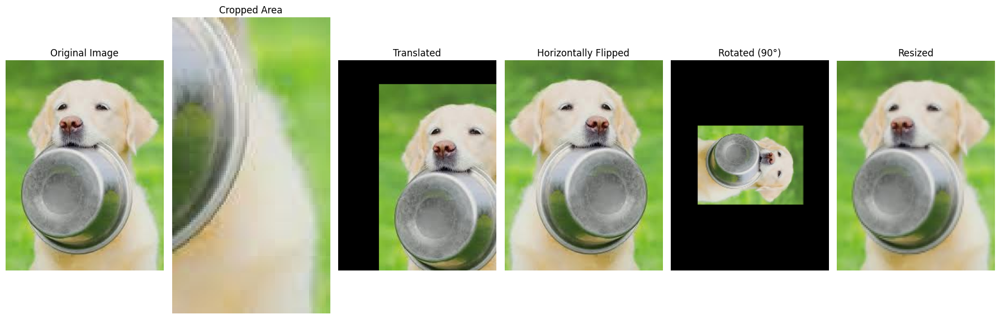

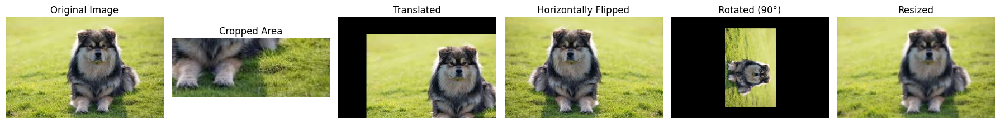

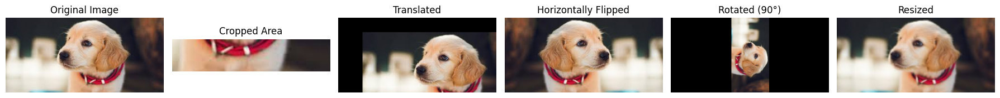

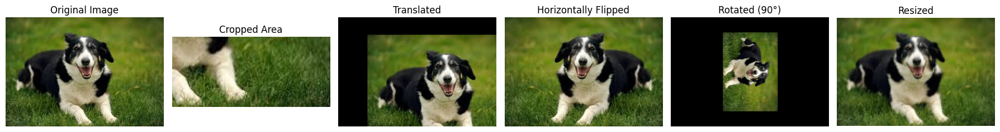

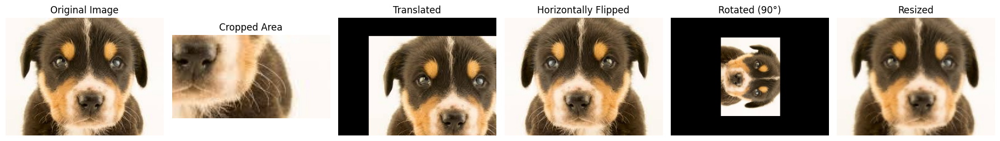

In [88]:
def apply_transformations(image_path):
    image = cv2.imread(f"/content/Dataset1/{img}")
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


    # Crop
    cropped_image = image_rgb[120:260, 120:290]  # Adjusted region for crop

    #Translation
    translation_matrix = np.float32([[1, 0, 50], [0, 1, 30]])
    translated_image = cv2.warpAffine(image_rgb, translation_matrix, (cols, rows))

    # Flip
    horizontal_flip = cv2.flip(image_rgb, 1)

    # Rotation
    rows, cols = image_rgb.shape[:2]
    rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), -90, 0.5)
    rotated_image = cv2.warpAffine(image_rgb, rotation_matrix, (cols, rows))

    # Resize
    scale_percent = 50
    new_width = int(image_rgb.shape[1] * scale_percent / 100)
    new_height = int(image_rgb.shape[0] * scale_percent / 100)
    resized_image = cv2.resize(image_rgb, (new_width, new_height), interpolation=cv2.INTER_AREA)



    transformed_images = [image_rgb, cropped_image,  translated_image,horizontal_flip, rotated_image, resized_image,]
    transformation_titles = ["Original Image", "Cropped Area",  "Translated", "Horizontally Flipped", "Rotated (90°)", "Resized",]

    num_images = len(transformed_images)
    fig, ax = plt.subplots(1, num_images, figsize=(18, 6))

    for i, (transformed, title) in enumerate(zip(transformed_images, transformation_titles)):
        ax[i].imshow(transformed)
        ax[i].set_title(title)
        ax[i].axis("off")

    plt.tight_layout()
    plt.show()

for img in image_list:
    apply_transformations(img)

Resoning behind using these transformations:
Crop: Removing a specific part of an image to focus on a particular area.
Translate: Shifting the image in any direction (up, down, left, or right) without rotating or resizing it.
Rotate: Rotating the image around its center to change its orientation.
Resize: Changing the size of the image, either making it larger or smaller.
Flip: Reversing the image horizontally or vertically to create a mirror effect.

Task 2) 3

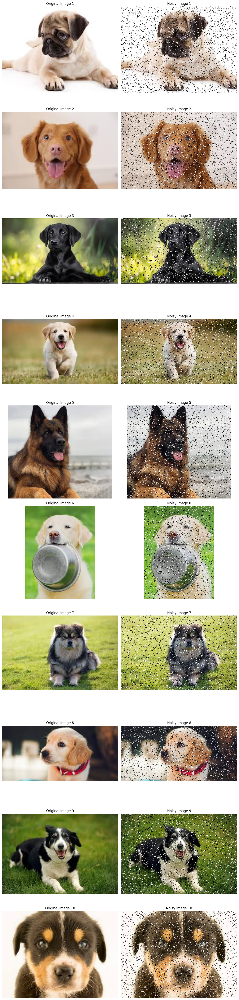

In [84]:
noisy_imgs = []

def random_noise(image):
    row, col, ch = image.shape
    prob = 0.05

    noisy_image = np.copy(image)
    num_salt = np.ceil(prob * image.size * 0.5).astype(int)
    num_pepper = np.ceil(prob * image.size * 0.5).astype(int)

    # Adding white pixels
    coords = [np.random.randint(0, i - 1, num_salt) for i in image.shape]
    noisy_image[coords[0], coords[1]] = 255

    # Adding black pixels
    coords = [np.random.randint(0, i - 1, num_pepper) for i in image.shape]
    noisy_image[coords[0], coords[1]] = 0

    return noisy_image,coords


for img in image_list:
    img = cv2.imread(f"/content/Dataset1/{img}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    noisy_img,coords = random_noise(img)
    noisy_imgs.append((img, noisy_img))


fig = plt.figure(figsize=(12, len(noisy_imgs) * 5))

for idx, (original, noisy) in enumerate(noisy_imgs):
    # original image
    ax1 = fig.add_subplot(len(noisy_imgs), 2, idx * 2 + 1)
    ax1.imshow(original)
    ax1.set_title(f"Original Image {idx + 1}")
    ax1.axis("off")

    #noisy image
    ax2 = fig.add_subplot(len(noisy_imgs), 2, idx * 2 + 2)
    ax2.imshow(noisy)
    ax2.set_title(f"Noisy Image {idx + 1}")
    ax2.axis("off")

plt.tight_layout()
plt.show()

Task 2) 4

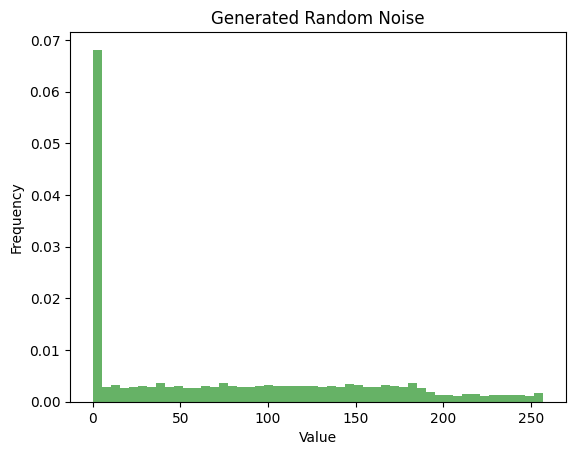

In [81]:
random_noise = np.array(coords)
flattened_noise = random_noise.flatten()

plt.hist(flattened_noise, bins=50, density=True, alpha=0.6, color='g')
plt.title('Generated Random Noise')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.show()

Task 3) 2

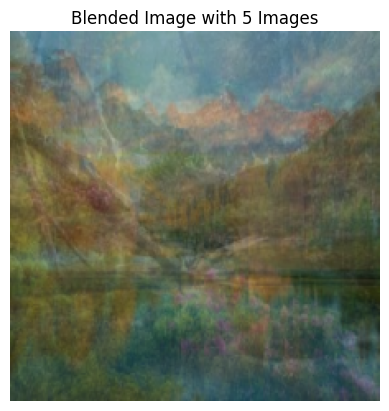

In [53]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_paths = ['./a.jpeg', './b.jpeg', './c.jpeg', './d.jpeg', './e.jpeg']
images = [cv2.imread(img_path) for img_path in img_paths]

width, height = 225, 225
dim = (width, height)
images_resized = [cv2.resize(img, dim, interpolation=cv2.INTER_AREA) for img in images]


alpha_values = [0.2, 0.2, 0.2, 0.2, 0.2]


result = alpha_values[0] * images_resized[0]


for i in range(1, len(images_resized)):
    result += alpha_values[i] * images_resized[i]

result = result.astype('uint8')

plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title("Blended Image with 5 Images")
plt.axis('off')
plt.show()


Task3) 3

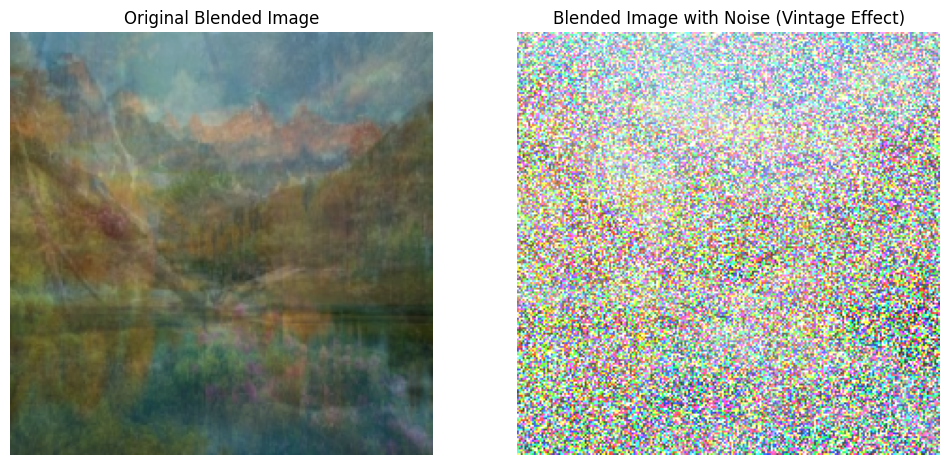

In [57]:

def add_gaussian_noise(image, mean=0, sigma=25):

    gaussian_noise = np.random.normal(mean, sigma, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, gaussian_noise)
    return noisy_image,gaussian_noise

images = []




result = result.astype('uint8')

noisy_result,noise = add_gaussian_noise(result, mean=0, sigma=25)

plt.figure(figsize=(12, 6))


# Org img
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title("Original Blended Image")
plt.axis('off')


plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(noisy_result, cv2.COLOR_BGR2RGB))
plt.title("Blended Image with Noise (Vintage Effect)")
plt.axis('off')
plt.show()

Task 3) 4

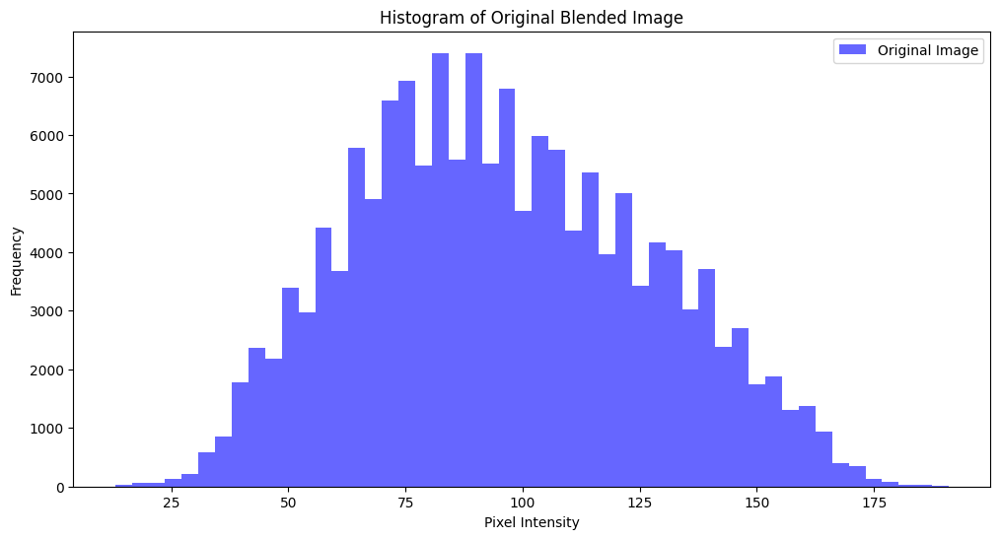

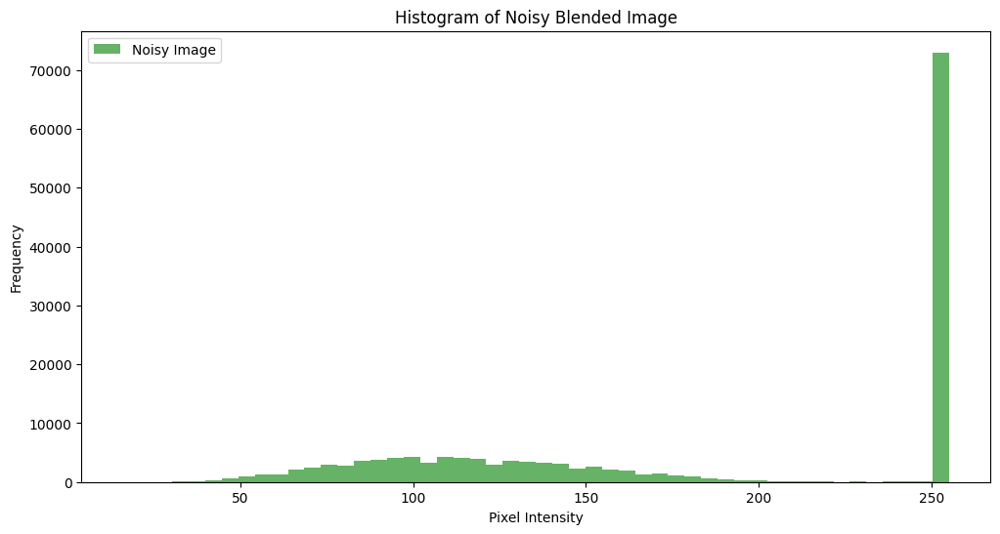

In [60]:

plt.figure(figsize=(12, 6))
plt.hist(result.flatten(), bins=50, color='blue', alpha=0.6, label='Original Image')
plt.title("Histogram of Original Blended Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
plt.hist(noisy_result.flatten(), bins=50, color='green', alpha=0.6, label='Noisy Image')
plt.title("Histogram of Noisy Blended Image")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend()
plt.show()